In [ ]:
# https://github.com/deepmipt/Slavic-BERT-NER#slavic-bert
# https://www.machinelearningplus.com/nlp/training-custom-ner-model-in-spacy/
# https://colab.research.google.com/github/NielsRogge/Transformers-Tutorials/blob/master/BERT/Custom_Named_Entity_Recognition_with_BERT_only_first_wordpiece.ipynb

In [2]:
import pandas as pd
import spacy
import re
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from spacy import displacy
import random
from tqdm import tqdm
from spacy.tokens import DocBin
random.seed = 0

In [3]:
df = pd.read_hdf('./outputs/budzety_clean.h5')

### Domyślne NERy

In [4]:
nlp=spacy.load('pl_core_news_lg')

In [5]:
# Konwertujemy nazwy budżetów na jeden ciąg tekstu
docs = list(df.loc[:, 'nazwa'].values)
plain_text = '. '.join([str(elem) for elem in docs])

In [ ]:
plain_text

In [7]:
# nlp spacy'ego ma ograniczenie co do długości tekstu jaki jest w stanie przetworzyć
# jest to związane z ilością przydzielonej pamięci (ok. 1 GB). Zwiększamy ten limit
# za pomocą max_length.
nlp.max_length = len(plain_text) + 100

test = nlp(plain_text)

In [56]:
# Tworzymy słownik ze znalezionymi NERami
ent_dict = {}
for k, v in [(ent.text, ent.label_) for ent in test.ents]:
  ent_dict.setdefault(v, []).append(k)

In [57]:
# Znaleziono w sumie 6 NERów
ent_dict.keys()

dict_keys(['placeName', 'persName', 'geogName', 'orgName', 'date', 'time'])

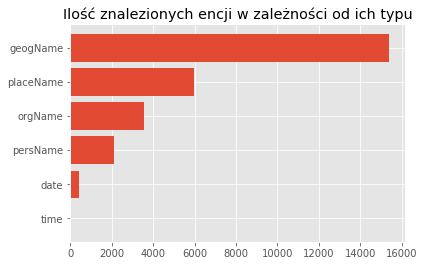

In [58]:
# Zwizualizujmy ilość znalezionych NERów
plt.title('Ilość znalezionych encji w zależności od ich typu')
ner_len = sorted([(k, len(v)) for k, v in ent_dict.items()], key=lambda x: x[1])
plt.barh([elem[0] for elem in ner_len], [elem[1] for elem in ner_len]);

In [59]:
# Zwizualizujmy znalezione NERY
displacy.render(test, style='ent', jupyter=True)

In [79]:
# Zapiszmy znalezione encje jako stronę html
html = displacy.render(test, style='ent', page=True, jupyter=False)

In [80]:
with open('./outputs/base_ner_vis.html', 'w', encoding="utf-8") as f:
  f.write(html)

### Custom NERy

In [5]:
nlp=spacy.load('pl_core_news_lg')

In [67]:
# Tasujemy nazwy budżetów i zmniejszamy ich ilość ustalając długość zbioru treningowego
docs = list(df.loc[:, 'nazwa'].values)
random.shuffle(docs)
train_text = '. '.join([str(elem) for elem in docs])

TRAIN_SIZE = 0.3

reduce_size = int(len(train_text) * TRAIN_SIZE)
print(f'Original size: {len(train_text):_}')
print(f'Reduced size: {reduce_size:_}')

Original size: 1_534_344
Reduced size: 460_303


In [11]:
NER_MATCH_DICT = {
    'OŚWIETL': ('oświetlenie', 'świetlny', 'lampa', 'doświetlenie', 'światło', 'oswietlenie', 'iluminacja', 'świetlna'), 
    'SPORT': ('piłka', 'tenis','stadion','nożny', 'stół', 'boisko', 'tenis stołowy', 'turniej', 'boisko','gra', 'siatkówka', 'sportowy','koszykówka', 'liga', 'plażowy', 'tenisowy', 'badminton', 'sportowo'),
    'ZWIERZ': ('pies', 'psi', 'pszczoła', 'komar', 'owad', 'nietoperz', 'zwierzę', 'wiewiórka'),
    'WODA': ('fontanna', 'woda', 'toaleta', 'wodny', 'łazienka', 'kanalizacja', 'rzeka', 'jezioro'),
    'ZIELEŃ': ('zielony', 'zieleń', 'zielono', 'zieleniec', 'zakątek', 'zazielenić', 'ekologiczny', 'rekultywacja'),
    'BIBLIO': ('biblioteka', 'książka', 'audiobook', 'wydawniczy', 'czytelnik', 'multimedialny', 'czytać', 'książkowy', 'biblioteczny', 'czytanie'),
    'BOTANIKA': ('drzewo', 'ogród', 'łąka', 'kwiat', 'trawnik', 'kwiatowy', 'botaniczny', 'kwitnąć', 'żywopłot', 'ogródka'),
    'POWIETRZE': ('powietrze', 'smog', 'monitoring', 'mobilny', 'elektroniczny', 'radarowy', 'czujnik'),
    'SZKOŁA': ('szkoła', 'przedszkole', 'szkolny', 'przedszkolny', 'edukacyjny', 'młodzież', 'przedszkolak', 'edukacja', 'boisko'),
    'REKREACJA': ('siłownia', 'piknik', 'rekreacja', 'rekreacyjny', 'aktywny', 'piknikowy', 'zabawa', 'szkolenie', 'festyn', 'lato', 'rodzinny', 'piknik rodzinny', 'piknik integracyjny'),
    'ROWER': ('rower', 'stacja', 'monitoring', 'stojak', 'naprawa rower', 'rower miejski', 'stacja napraw', 'rowerowy', 'naprawa', 'stojak rower', 'monitoring miejski', 'samoobsługowy', 'wygodnie', 'samoobsługowy stacja', 'stacja rower', 'rozbudowa'),
    'GRY': ('gra', 'mapa', 'terenowy', 'bieg', 'orientacja', 'planszowa'),
    'BEZPIECZ.': ('pieszy', 'przejście', 'bezpieczny', 'bezpieczeństwo', 'bezpieczny przejście', 'sygnalizacja', 'sygnalizacja świetlny', 'skrzyżowanie')

    }

In [12]:
# Jeżeli chcemy wziąć pod uwagę polską deklinację, uruchom tą komórkę

# Customowa funkcja, która parsuje wikisłownik pod kątem odmiany deklinacyjnej rzeczownika
from declination import ret_declin_wiktionary

def ner_match_dict_declination():
    NEW_DICT = dict()
    for key in NER_MATCH_DICT.keys():
        cand = [ret_declin_wiktionary(elem) for elem in NER_MATCH_DICT[key]]
        cand = [elem for elem in cand if elem!=False]
        final = tuple([item for items in cand for item in list(set(items))])
        final += NER_MATCH_DICT[key] #bez tego będą tylko rzeczowniki
        final += tuple([elem.upper() for elem in final])
        final += tuple([elem.capitalize() for elem in final])
        NEW_DICT[key] = tuple(set(final))
    return NEW_DICT

NER_MATCH_DICT = ner_match_dict_declination()

In [13]:
NER_MATCH_DICT

{'OŚWIETL': ('OŚWIETLENIU',
  'LAMPA',
  'Lampy',
  'ŚWIATŁA',
  'OŚWIETLENIEM',
  'Oświetlenie',
  'światła',
  'doświetlenie',
  'OŚWIETLENIA',
  'ŚWIATŁO',
  'oświetlenie',
  'Lampą',
  'ŚWIATŁEM',
  'ŚWIETLNY',
  'Oświetleniu',
  'świetle',
  'ILUMINACJA',
  'LAMPĄ',
  'LAMPIE',
  'OSWIETLENIE',
  'Oświetlenia',
  'Świetlna',
  'Oświetleniem',
  'Światłu',
  'światło',
  'Iluminacja',
  'LAMPĘ',
  'światłem',
  'OŚWIETLENIE',
  'Lampa',
  'świetlna',
  'oświetlenia',
  'Lampę',
  'Światła',
  'ŚWIETLNA',
  'światłu',
  'LAMPO',
  'Lampo',
  'oświetleniem',
  'lampie',
  'oświetleniu',
  'Oswietlenie',
  'lampy',
  'DOŚWIETLENIE',
  'Świetle',
  'Światłem',
  'lampo',
  'ŚWIETLE',
  'Doświetlenie',
  'lampą',
  'oswietlenie',
  'iluminacja',
  'lampa',
  'lampę',
  'świetlny',
  'Świetlny',
  'LAMPY',
  'Światło',
  'ŚWIATŁU',
  'Lampie'),
 'SPORT': ('tenisowi',
  'piłka',
  'LIGI',
  'KOSZYKÓWCE',
  'Koszykówce',
  'Stadionie',
  'siatkówka',
  'nożny',
  'boiska',
  'BADMINTONEM',

In [14]:
# Tworzymy zmienną TRAIN_DATA, która zawiera format naszych NERów
TRAIN_DATA = []
for key in NER_MATCH_DICT.keys():
  for value in NER_MATCH_DICT[key]:
    found = df['nazwa'].apply(lambda x:  [{'entities': [(elem.start(), elem.end(), key)]} for elem in re.finditer(value, x)])
    found = found[found.str.len()!=0]
    found = found.apply(lambda x: x[0])
    ind = found.index

    dict_df = pd.concat([df['nazwa'][ind], found], axis=1)
    dict_df.columns = ['nazwa', 'pos']

    for elem in ind:
      TRAIN_DATA.append((dict_df['nazwa'][elem], dict_df['pos'][elem]))

In [15]:
TRAIN_DATA

[('Widoczny pieszy – Lampy doświetlające przejścia. Katowice Osiedle Tysiąclecie Bezpieczne przejście dla pieszych to Twój spokojny powrót do domu - ulica Ułańska',
  {'entities': [(18, 23, 'OŚWIETL')]}),
 ('Widoczny pieszy – Lampy doświetlające przejścia. Katowice Osiedle Tysiąclecie Bezpieczne przejście dla pieszych to Twój spokojny powrót do domu - ulica Bolesława Chrobrego',
  {'entities': [(18, 23, 'OŚWIETL')]}),
 ('Widoczny pieszy – Lampy doświetlające przejścia. Katowice Osiedle Tysiąclecie Bezpieczne przejście dla pieszych to Twój spokojny powrót do domu - ulica Tysiąclecia',
  {'entities': [(18, 23, 'OŚWIETL')]}),
 ('Widoczny pieszy – Lampy doświetlające przejścia. Katowice Osiedle Tysiąclecie Bezpieczne przejście dla pieszych to Twój spokojny powrót do domu - ulica Mieszka I',
  {'entities': [(18, 23, 'OŚWIETL')]}),
 ('Widoczny pieszy – Lampy doświetlające przejścia. Katowice Osiedle Tysiąclecie Bezpieczne przejście dla pieszych to Twój spokojny powrót do domu',
  {'entities'

In [84]:
# # Tworzymy zmienną TRAIN_DATA, która zawiera format naszych NERów
# found = df['nazwa'].apply(lambda x:  [{'entities': [(elem.start(), elem.end(), 'OŚWIETL')]} for elem in re.finditer('oświetlenie', x)])
# found = found[found.str.len()!=0]
# found = found.apply(lambda x: x[0])
# ind = found.index

# dict_df = pd.concat([df['nazwa'][ind], found], axis=1)
# dict_df.columns = ['nazwa', 'pos']

# TRAIN_DATA = []
# for elem in ind:
#   TRAIN_DATA.append((dict_df['nazwa'][elem], dict_df['pos'][elem]))

In [72]:
len(TRAIN_DATA)

21419

In [73]:
# Tworzymy zserializowaną informację

db = DocBin()
skipped_entities = 0

for text, annot in tqdm(TRAIN_DATA):
  doc = nlp.make_doc(text)
  ents = []
  for start, end, label in annot['entities']:
    span = doc.char_span(start, end, label=label, alignment_mode='contract')
    if span is None:
      skipped_entities+=1
    else:
      ents.append(span)
  doc.ents = ents
  db.add(doc)
print(f'Skipped entities {skipped_entities}')

100%|██████████| 21419/21419 [00:14<00:00, 1513.88it/s]

Skipped entities 9185


In [74]:
db.to_disk('./models/train.spacy')

In [92]:
# Tworzenie pliku config.cfg z pliku base_config.cfg.
# Plik base_config.cfg można utworzyć stąd: https://spacy.io/usage/training#quickstart
# 
# Jeżeli oba te pliki już istnieją w folderze 'models', pomiń ten krok

!python -m spacy init fill-config ./models/base_config.cfg ./models/config.cfg

✔ Auto-filled config with all values
✔ Saved config
models\config.cfg
You can now add your data and train your pipeline:
python -m spacy train config.cfg --paths.train ./train.spacy --paths.dev ./dev.spacy


2022-01-06 16:58:59.847542: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'cudart64_110.dll'; dlerror: cudart64_110.dll not found
2022-01-06 16:58:59.848304: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [75]:
# Właściwe trenowanie modelu

!python -m spacy train ./models/config.cfg --output ./models --paths.train ./models/train.spacy --paths.dev ./models/train.spacy

ℹ Saving to output directory: models
ℹ Using CPU

=========================== Initializing pipeline ===========================
✔ Initialized pipeline

============================= Training pipeline =============================
ℹ Pipeline: ['tok2vec', 'ner']
ℹ Initial learn rate: 0.001
E    #       LOSS TOK2VEC  LOSS NER  ENTS_F  ENTS_P  ENTS_R  SCORE 
---  ------  ------------  --------  ------  ------  ------  ------
  0       0          0.00     38.15    0.00    0.00    0.00    0.00
  0     200         48.43   2078.86    0.71   51.16    0.36    0.01
  0     400         58.10   1535.40   23.71   44.14   16.21    0.24
  0     600         91.81   1816.36   35.61   43.05   30.37    0.36
  0     800        115.51   2200.29   34.49   45.42   27.80    0.34
  0    1000        120.83   2402.36   43.08   44.31   41.92    0.43
  0    1200        246.58   2982.33   17.32   52.33   10.38    0.17
  0    1400        187.87   3574.88   32.83   51.57   24.08    0.33
  1    1600        190.70   425

2022-01-07 13:12:14.845427: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'cudart64_110.dll'; dlerror: cudart64_110.dll not found
2022-01-07 13:12:14.846037: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
[2022-01-07 13:12:27,697] [INFO] Set up nlp object from config
[2022-01-07 13:12:27,719] [INFO] Pipeline: ['tok2vec', 'ner']
[2022-01-07 13:12:27,728] [INFO] Created vocabulary
[2022-01-07 13:12:27,729] [INFO] Finished initializing nlp object
[2022-01-07 13:12:52,479] [INFO] Initialized pipeline components: ['tok2vec', 'ner']


### Sprawdzenie wytworzonego modelu

In [8]:
nlp_ner = spacy.load('./models/model-best')

# Sprawdzimy na mniejszym zbiorze
docs = list(df.loc[:, 'nazwa'].values)
plain_text = '. '.join([str(elem) for elem in docs])
doc = nlp_ner(plain_text[:80_000])

In [17]:
TRAIN_DATA

[('Widoczny pieszy – Lampy doświetlające przejścia. Katowice Osiedle Tysiąclecie Bezpieczne przejście dla pieszych to Twój spokojny powrót do domu - ulica Ułańska',
  {'entities': [(18, 23, 'OŚWIETL')]}),
 ('Widoczny pieszy – Lampy doświetlające przejścia. Katowice Osiedle Tysiąclecie Bezpieczne przejście dla pieszych to Twój spokojny powrót do domu - ulica Bolesława Chrobrego',
  {'entities': [(18, 23, 'OŚWIETL')]}),
 ('Widoczny pieszy – Lampy doświetlające przejścia. Katowice Osiedle Tysiąclecie Bezpieczne przejście dla pieszych to Twój spokojny powrót do domu - ulica Tysiąclecia',
  {'entities': [(18, 23, 'OŚWIETL')]}),
 ('Widoczny pieszy – Lampy doświetlające przejścia. Katowice Osiedle Tysiąclecie Bezpieczne przejście dla pieszych to Twój spokojny powrót do domu - ulica Mieszka I',
  {'entities': [(18, 23, 'OŚWIETL')]}),
 ('Widoczny pieszy – Lampy doświetlające przejścia. Katowice Osiedle Tysiąclecie Bezpieczne przejście dla pieszych to Twój spokojny powrót do domu',
  {'entities'

In [22]:
examples = [(elem[0], {elem[1]['entities'][0]}) for elem in TRAIN_DATA]
examples

[('Widoczny pieszy – Lampy doświetlające przejścia. Katowice Osiedle Tysiąclecie Bezpieczne przejście dla pieszych to Twój spokojny powrót do domu - ulica Ułańska',
  {(18, 23, 'OŚWIETL')}),
 ('Widoczny pieszy – Lampy doświetlające przejścia. Katowice Osiedle Tysiąclecie Bezpieczne przejście dla pieszych to Twój spokojny powrót do domu - ulica Bolesława Chrobrego',
  {(18, 23, 'OŚWIETL')}),
 ('Widoczny pieszy – Lampy doświetlające przejścia. Katowice Osiedle Tysiąclecie Bezpieczne przejście dla pieszych to Twój spokojny powrót do domu - ulica Tysiąclecia',
  {(18, 23, 'OŚWIETL')}),
 ('Widoczny pieszy – Lampy doświetlające przejścia. Katowice Osiedle Tysiąclecie Bezpieczne przejście dla pieszych to Twój spokojny powrót do domu - ulica Mieszka I',
  {(18, 23, 'OŚWIETL')}),
 ('Widoczny pieszy – Lampy doświetlające przejścia. Katowice Osiedle Tysiąclecie Bezpieczne przejście dla pieszych to Twój spokojny powrót do domu',
  {(18, 23, 'OŚWIETL')}),
 ('L9/10/V - Bezpieczny pieszy to widoczny 

In [25]:
# import spacy
from spacy.scorer import Scorer
from spacy.tokens import Doc
from spacy.training.example import Example

# examples = [
#     ('Who is Shaka Khan?',
#      {(7, 17, 'PERSON')}),
#     ('I like London and Berlin.',
#      {(7, 13, 'LOC'), (18, 24, 'LOC')})
# ]

def evaluate(ner_model, examples):
    scorer = Scorer()
    example = []
    for input_, annot in examples:
        pred = ner_model(input_)
        # print(pred,annot)
        temp = Example.from_dict(pred, dict.fromkeys(annot))
        example.append(temp)
    scores = scorer.score(example)
    return scores

# ner_model = spacy.load('en_core_web_sm') # for spaCy's pretrained use 'en_core_web_sm'
results = evaluate(nlp_ner, examples)
print(results)

{'token_acc': 1.0, 'token_p': 1.0, 'token_r': 1.0, 'token_f': 1.0, 'sents_p': 1.0, 'sents_r': 1.0, 'sents_f': 1.0, 'tag_acc': None, 'pos_acc': None, 'morph_acc': None, 'morph_micro_p': None, 'morph_micro_r': None, 'morph_micro_f': None, 'morph_per_feat': None, 'dep_uas': None, 'dep_las': None, 'dep_las_per_type': None, 'ents_p': None, 'ents_r': None, 'ents_f': None, 'ents_per_type': None, 'cats_score': 0.0, 'cats_score_desc': 'macro F', 'cats_micro_p': 0.0, 'cats_micro_r': 0.0, 'cats_micro_f': 0.0, 'cats_macro_p': 0.0, 'cats_macro_r': 0.0, 'cats_macro_f': 0.0, 'cats_macro_auc': 0.0, 'cats_f_per_type': {}, 'cats_auc_per_type': {}}


In [26]:
from spacy import 
def evaluate2(ner_model, examples):
    scorer = Scorer()
    for input_, annot in examples:
        doc_gold_text = ner_model.make_doc(input_)
        gold = GoldParse(doc_gold_text, entities=annot)
        pred_value = ner_model(input_)
        scorer.score(pred_value, gold)
    return scorer.scores

ModuleNotFoundError: No module named 'spacy.gold'

In [77]:
# Kolorki np. tutaj: https://cssgradient.io/
colors = {
    'OŚWIETL': 'linear-gradient(90deg, rgba(131,58,180,1) 0%, rgba(173,185,23,1) 0%, rgba(252,176,69,1) 95%)', 
    'SPORT': 'radial-gradient(circle, rgba(131,58,180,1) 0%, rgba(160,176,41,1) 0%)',
    'ZWIERZ': 'radial-gradient(circle, rgba(186,171,178,1) 0%, rgba(64,66,70,1) 100%)',
    'WODA': 'linear-gradient(85deg, rgba(2,0,36,1) 0%, rgba(73,73,185,1) 49%, rgba(0,212,255,1) 100%)',
    'ZIELEŃ': 'linear-gradient(273deg, rgba(70,129,16,1) 0%, rgba(16,172,47,1) 71%)',
    'BIBLIO': 'linear-gradient(273deg, rgba(70,129,16,1) 0%, rgba(79,120,16,1) 9%, rgba(172,23,16,1) 94%)',
    'BOTANIKA': 'linear-gradient(273deg, rgba(66,98,37,1) 31%, rgba(132,203,23,1) 100%)',
    'POWIETRZE': 'linear-gradient(273deg, rgba(255,255,255,1) 31%, rgba(158,164,148,1) 100%)',
    'SZKOŁA': 'radial-gradient(circle, rgba(171,24,181,1) 0%, rgba(66,64,70,1) 100%)',
    'REKREACJA': 'radial-gradient(circle, rgba(238,174,202,1) 0%, rgba(148,187,233,1) 100%)',
    'ROWER': 'linear-gradient(90deg, rgba(26,186,149,1) 0%, rgba(39,198,177,1) 100%)',
    'GRY': 'radial-gradient(circle, rgba(26,94,186,1) 0%, rgba(39,198,188,1) 100%)',
    'BEZPIECZ.': 'radial-gradient(circle, rgba(185,28,28,1) 20%, rgba(149,112,100,1) 100%)'
    }
options = {'ents': list(colors.keys()), 'colors': colors}

In [78]:
spacy.displacy.render(doc, style='ent', jupyter=True, options=options)

### Sprawdzenie utworzonego nowego nera

In [79]:
NER_MATCH_DICT['SPORT']

('LIDZE',
 'badmintonie',
 'Koszykówko',
 'TURNIEJOWI',
 'Plażowy',
 'badminton',
 'Piłka',
 'Tenisowy',
 'KOSZYKÓWKA',
 'Stadionowi',
 'Stołu',
 'siatkówce',
 'Koszykówkę',
 'Gra',
 'siatkówkę',
 'BADMINTON',
 'piłki',
 'TENIS STOŁOWY',
 'Ligi',
 'liga',
 'Tenis stołowy',
 'Piłką',
 'Sportowo',
 'gra',
 'tenis',
 'Boiskiem',
 'TURNIEJ',
 'BOISKA',
 'piłka',
 'Turnieju',
 'Stołowi',
 'TENIS',
 'NOŻNY',
 'TURNIEJU',
 'Badminton',
 'Ligą',
 'Stadionem',
 'SIATKÓWKA',
 'Boisko',
 'piłko',
 'STOŁOWI',
 'TURNIEJEM',
 'stadionie',
 'sportowy',
 'stadionu',
 'Tenisie',
 'BADMINTONEM',
 'BADMINTONA',
 'BADMINTONOWI',
 'Tenisowi',
 'nożny',
 'Tenisem',
 'Badmintonem',
 'turniej',
 'stołem',
 'SPORTOWO',
 'siatkówka',
 'piłce',
 'BOISKIEM',
 'koszykówce',
 'Ligę',
 'Koszykówka',
 'STOLE',
 'Badmintonie',
 'plażowy',
 'piłkę',
 'Ligo',
 'tenisowy',
 'KOSZYKÓWKO',
 'Piłce',
 'Koszykówki',
 'badmintona',
 'turniejowi',
 'PLAŻOWY',
 'STOŁEM',
 'Stołem',
 'Piłkę',
 'Siatkówka',
 'ligą',
 'Badmintonow

In [82]:
# słowo 'tenis' należało pierwotnie do kategorii sport
'tenis' in NER_MATCH_DICT['SPORT']

True

In [83]:
# algorytm przypisał słowo 'zumba' do kategorii 'sport'
# mimo, że pierwotnie to słowo nie należało do tej kategorii
'ZUMBA' in NER_MATCH_DICT['SPORT']

False

In [90]:
# sprawdźmy zumbę
zumbda_df = df[df['nazwa'].str.contains('ZUMBA')]['nazwa']
zumbda_df

350                                 ZUMBA zajęcia taneczne
7050                                       BULWAROWA ZUMBA
14622    Zajęcia taneczne wspierające uczniów w trudnoś...
23692                                     ZUMBA DLA DZIECI
Name: nazwa, dtype: object

In [92]:
def show_ents(doc):
    print('-'*10)
    print('>>>',doc)
    if doc.ents:
        for ent in doc.ents:
            print(ent.text + ' - ' + ent.label_)
    else:
        print('No NERs.')

In [94]:
for sentence in zumbda_df:
    show_ents(nlp_ner(sentence))

----------
>>> ZUMBA zajęcia taneczne
ZUMBA - SPORT
----------
>>> BULWAROWA ZUMBA
ZUMBA - SPORT
----------
>>> Zajęcia taneczne wspierające uczniów w trudnościach emocjonalnych - ZUMBA. 
No NERs.
----------
>>> ZUMBA DLA DZIECI
ZUMBA - SPORT


In [95]:
sentences = [
    'Poprawa atrakcyjności skweru przy skrzyżowaniu z ulicą Ogrodową',
    'Nie ma nikogo na skrzyżowaniu',
    'Poprawa jakości skrzyżowania',
    'Zmiana oznakowania na skrzyżowaniu'
    ]

for sentence in sentences:
    show_ents(nlp_ner(sentence))

----------
>>> Poprawa atrakcyjności skweru przy skrzyżowaniu z ulicą Ogrodową
skrzyżowaniu - BEZPIECZ.
----------
>>> Nie ma nikogo na skrzyżowaniu
No NERs.
----------
>>> Poprawa jakości skrzyżowania
skrzyżowania - BEZPIECZ.
----------
>>> Zmiana oznakowania na skrzyżowaniu
skrzyżowaniu - BEZPIECZ.


In [ ]:
# Zapisanie do pliku
html_custom = displacy.render(doc, style='ent', jupyter=False, options=options)
with open('./outputs/custom_ner_vis.html', 'w', encoding="utf-8") as f:
  f.write(html_custom)